**Разработка сервиса для прогнозирования длительности движения вагонов**

Вам предлагается создать сервис, прогнозирующий время в пути от станции отправления до станции назначения на всей ЖД сети на основании исторических данных. Такой сервис станет основополагающим для всех продуктов ПГК, позволит их объединить и напрямую повлиять на успешность финансовых показателей компании.

Описание полей:
- st_code_snd - id станции отправления;
- st_code_rsv - id станции назначения;
- date_depart_year – год отправления;
- date_depart_month – месяц отправления;
- date_depart_week – неделя отправления;
- date_depart_day – день отправления;
- date_depart_hour – час отправления;
- fr_id - id груза;
- route_type - тип отправки;
- is_load – признак гружёности (1 - гружёный, 0 - порожний);
- rod – род подвижного состава;
- common_ch - id обобщённой характеристики вагона;
- vidsobst - вид собственности;
- distance - расстояние рейса;
- snd_org_id - id грузоотправителя;
- rsv_org_id – id грузополучателя;
- snd_roadid - id дороги отправления;
- rsv_roadid – id дороги назначения;
- snd_dp_id – id региона отправления;
- rsv_dp_id – id региона назначения;
- y – таргет (время в пути в часах).

In [1]:
!pip install pyarrow


[notice] A new release of pip available: 22.2.2 -> 22.3.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import pandas as pd
import numpy as np
import pandas_profiling
import hvplot.pandas
from tensorflow.signal import rfft
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, PowerTransformer, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import lightgbm as lgb
import pickle

from sklearn.compose import TransformedTargetRegressor
from sklearn.preprocessing import QuantileTransformer

# Загрузка данных

In [3]:
RANDOM_STATE = 777

In [4]:
data = pd.read_parquet('datasets/df_train.parquet')

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4219370 entries, 0 to 4219369
Data columns (total 21 columns):
 #   Column             Dtype  
---  ------             -----  
 0   st_code_snd        object 
 1   st_code_rsv        object 
 2   date_depart_year   int64  
 3   date_depart_month  int64  
 4   date_depart_week   int64  
 5   date_depart_day    int64  
 6   date_depart_hour   int64  
 7   fr_id              float64
 8   route_type         float64
 9   is_load            int64  
 10  rod                int64  
 11  common_ch          float64
 12  vidsobst           float64
 13  distance           float64
 14  snd_org_id         int64  
 15  rsv_org_id         int64  
 16  snd_roadid         int32  
 17  rsv_roadid         int32  
 18  snd_dp_id          int64  
 19  rsv_dp_id          int64  
 20  y                  float64
dtypes: float64(6), int32(2), int64(11), object(2)
memory usage: 643.8+ MB


In [6]:
data.head()

,st_code_snd,st_code_rsv,date_depart_year,date_depart_month,date_depart_week,date_depart_day,date_depart_hour,fr_id,route_type,is_load,...,common_ch,vidsobst,distance,snd_org_id,rsv_org_id,snd_roadid,rsv_roadid,snd_dp_id,rsv_dp_id,y
0,wagonwagonwagontutu:)wagon,wagondigitalnewyearrailway:)happy,2021,11,45,12,14,3399.0,4.0,1,...,11.0,102.0,930.0,1098,5476,13,13,78,75,185.200000
1,railwaypgkhappyrailway:)railway,digitalhappynewyeardigital:)wagon,2021,4,15,17,16,2261.0,3.0,0,...,9.0,111.0,16.0,2974,6682,21,21,111,111,0.250000
2,railwaytutupgkpgk:)digital,pgkdigitalrailway:):)happy,2021,5,17,2,7,1089.0,3.0,1,...,9.0,111.0,879.0,2082,10729,9,9,67,23,109.133333
3,tuturailwaydigital2022:)digital,newyearnewyear20222022:)2022,2020,11,47,17,11,2261.0,4.0,0,...,975.0,103.0,8569.0,2974,10571,28,28,115,112,214.093056
4,railwaytutupgkpgk:)digital,pgkhappyrailwayhack:)railway,2020,12,52,25,5,1666.0,4.0,1,...,9.0,101.0,656.0,2082,9225,9,9,67,16,104.100000


In [7]:
profile = data.profile_report(title='Auto Dataset Report', progress_bar=True, explorative=True)
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/Users/dima/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4868: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

Смотрим выбросы

<AxesSubplot:>

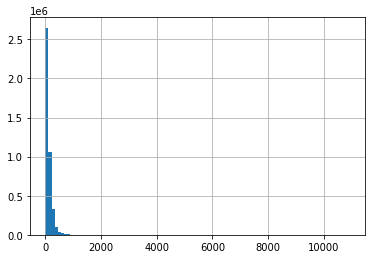

In [8]:
data['y'].hist(bins=100)

In [9]:
#data = data.drop(data[(data['y']<2) & (data['distance']>400)].index)

In [10]:
data['y'].hvplot.box(y='y')

:BoxWhisker   (y)

# Preprocessing

## Дата и время

In [11]:
data['year'] = data['date_depart_year']
data['month'] = data['date_depart_month']
data['day'] = data['date_depart_day']
data['hour'] = data['date_depart_hour']
data['minute'] = 0
data['second'] = 0

In [12]:
data['datetime'] = pd.to_datetime(data[['year', 'month', 'day', 'hour', 'minute', 'second']])

In [13]:
data['dayofweek'] = data['datetime'].dt.dayofweek

<AxesSubplot:xlabel='datetime'>

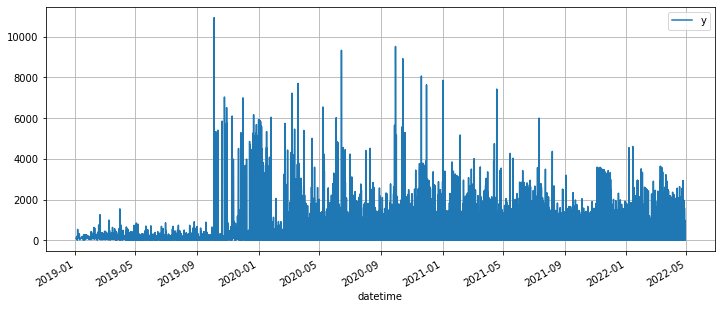

In [14]:
data.plot(x = 'datetime', y='y', grid=True, figsize=(12, 5))

<AxesSubplot:xlabel='datetime'>

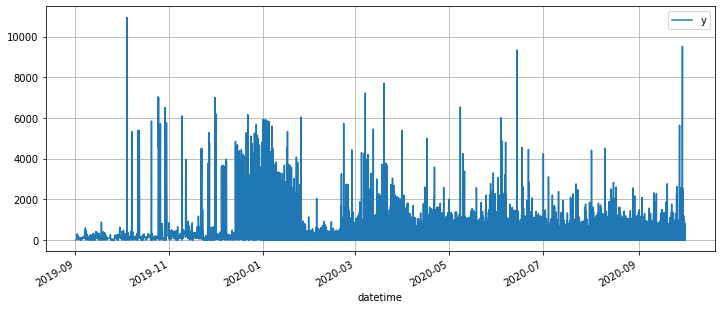

In [15]:
data[(data['datetime']<'2020-10-01') & (data['datetime']>'2019-09-01')].plot(x = 'datetime', y='y', grid=True, figsize=(12, 5))

## Маршруты

In [16]:
data['route'] = data['st_code_snd'] + data['st_code_rsv']

In [17]:
data['route'].value_counts()

railwaytutupgkhappy:)newyeardigitalhappynewyeardigital:)wagon    162045
happy:)pgkwagon:):)pgknewyeartutudigital:)wagon                   47062
2022wagondigital:)digitalpgk2022newyear:)pgk                      32235
digitalhappynewyeardigital:)wagonrailwaytutupgkhappy:)newyear     30305
railwaytutupgkhappy:)newyearrailwaytutupgkdigital:)hack           29414
                                                                  ...  
happypgktutu:)digitalnewyear:)railwayhack:)railway                    1
newyearrailway:)pgk:)digitalnewyearhappywagonhappy:):)                1
railwaytutupgkrailway:)railwaywagon:)happynewyear:)happy              1
2022wagontuturailway:):)2022wagonpgknewyear:)pgk                      1
happy:)happywagon:)happy2022hacktutuwagon:)railway                    1
Name: route, Length: 155597, dtype: int64

In [18]:
len(data['route'].unique())

155597

In [19]:
data.shape

(4219370, 30)

In [20]:
data['route'].value_counts().values[-68500:]

array([2, 2, 2, ..., 1, 1, 1])

In [21]:
#data['route'].value_counts().values[-115000:].sum() # раньше было для 10
data['route'].value_counts().values[-68500:].sum()

90780

Итого получается около 2% маршрутов встречались менее 3 раз, объединим их в отдельную категорию

In [22]:
rc = data['route'].value_counts()

In [23]:
data['route_category'] = data['route'].apply(lambda x: 'other' if rc[x] <= 3 else x)

In [24]:
data['route_category'].value_counts()

railwaytutupgkhappy:)newyeardigitalhappynewyeardigital:)wagon    162045
other                                                            132314
happy:)pgkwagon:):)pgknewyeartutudigital:)wagon                   47062
2022wagondigital:)digitalpgk2022newyear:)pgk                      32235
digitalhappynewyeardigital:)wagonrailwaytutupgkhappy:)newyear     30305
                                                                  ...  
wagontutuhackrailway:)happywagon2022wagondigital:)hack                4
pgkhackhackpgk:)digitalhacktutuhappydigital:):)                       4
2022tutunewyear2022:):)2022newyearhacknewyear:)happy                  4
hacknewyearhappywagon:)wagonhacktutu:)newyear:)2022                   4
railwaypgkrailwaywagon:)digitalnewyearhackdigital:):):)               4
Name: route_category, Length: 73111, dtype: int64

In [25]:
len(data['route_category'].unique())

73111

## Посмотрим временной ряд одного маршрута

In [26]:
#data_route = data[data['route']=='railwaytutupgkhappy:)newyeardigitalhappynewyeardigital:)wagon']
data_route = data[data['route']=='happy:)pgkwagon:):)pgknewyeartutudigital:)wagon']
data_route.shape

(47062, 31)

In [27]:
data_route.index = data_route['datetime']

In [28]:
data_route.index.is_monotonic

False

In [29]:
data_route = data_route.sort_index()

In [30]:
data_route.index.is_monotonic

True

In [31]:
data_route = data_route.resample('1H').median()
data_route.shape

(28487, 26)

<AxesSubplot:xlabel='datetime'>

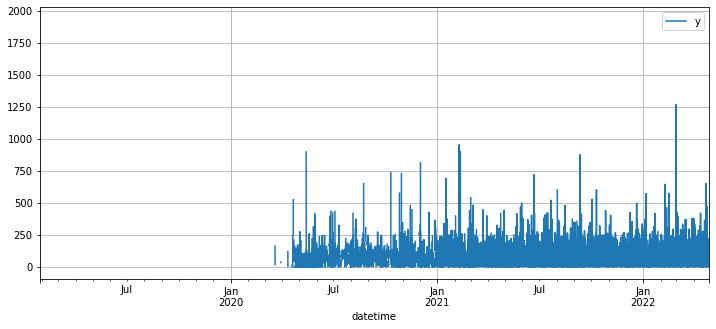

In [32]:
data_route.plot(y='y', grid=True, figsize=(12, 5))

In [33]:
data_route = data_route[(data_route.index>'2020-06-01')]

In [34]:
data_route = data_route[(data_route['y'] < 1000)]

In [35]:
data_route = data_route.resample('1H').median()
data_route.shape

(16703, 26)

In [36]:
data_route.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 16703 entries, 2020-06-01 01:00:00 to 2022-04-27 23:00:00
Freq: H
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   date_depart_year   12210 non-null  float64
 1   date_depart_month  12210 non-null  float64
 2   date_depart_week   12210 non-null  float64
 3   date_depart_day    12210 non-null  float64
 4   date_depart_hour   12210 non-null  float64
 5   fr_id              12210 non-null  float64
 6   route_type         12210 non-null  float64
 7   is_load            12210 non-null  float64
 8   rod                12210 non-null  float64
 9   common_ch          12086 non-null  float64
 10  vidsobst           11998 non-null  float64
 11  distance           12161 non-null  float64
 12  snd_org_id         12210 non-null  float64
 13  rsv_org_id         12210 non-null  float64
 14  snd_roadid         12210 non-null  float64
 15  rsv_roadid         12210 no

In [37]:
data_route['y'].interpolate(method='linear', inplace=True)

In [38]:
data_route.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 16703 entries, 2020-06-01 01:00:00 to 2022-04-27 23:00:00
Freq: H
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   date_depart_year   12210 non-null  float64
 1   date_depart_month  12210 non-null  float64
 2   date_depart_week   12210 non-null  float64
 3   date_depart_day    12210 non-null  float64
 4   date_depart_hour   12210 non-null  float64
 5   fr_id              12210 non-null  float64
 6   route_type         12210 non-null  float64
 7   is_load            12210 non-null  float64
 8   rod                12210 non-null  float64
 9   common_ch          12086 non-null  float64
 10  vidsobst           11998 non-null  float64
 11  distance           12161 non-null  float64
 12  snd_org_id         12210 non-null  float64
 13  rsv_org_id         12210 non-null  float64
 14  snd_roadid         12210 non-null  float64
 15  rsv_roadid         12210 no

## Частотный анализ

2022-12-18 14:48:42.307996: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


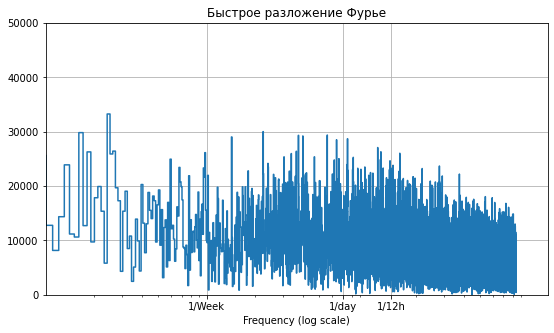

In [39]:
fft = rfft(data_route['y'])
f_per_dataset = np.arange(0, len(fft))

n_samples_h = len(data_route['y'])
hours_per_week = 24*7
week_per_dataset = n_samples_h/(hours_per_week)

f_per_week = f_per_dataset/week_per_dataset
plt.figure(figsize=(9,5))
plt.step(f_per_week, np.abs(fft))
plt.xscale('log')
plt.ylim(0, 50000)
plt.xlim([0.1, max(plt.xlim())])
plt.xticks([1, 7, 14], labels=['1/Week', '1/day', '1/12h'])
plt.xlabel('Frequency (log scale)')
plt.grid()
plt.title('Быстрое разложение Фурье');

**Вывод** Частот не видно

In [40]:
# annotations: https://stackoverflow.com/a/49238256/5769929
def seasonal_plot(X, y, period, freq, ax=None, show_labels=False, alpha=1.0):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette('husl', n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
        alpha = alpha
    )
    ax.set_title(f'Seasonal Plot ({period}/{freq})')
    if show_labels:
        for line, name in zip(ax.lines, X[period].unique()):
            y_ = line.get_ydata()[-1]
            ax.annotate(
                name,
                xy=(1, y_),
                xytext=(6, 0),
                color=line.get_color(),
                xycoords=ax.get_yaxis_transform(),
                textcoords='offset points',
                size=14,
                va='center',
            )
    return ax

In [41]:
data_route['dayofyear'] = data_route.index.day_of_year

In [42]:
data_route.columns

Index(['date_depart_year', 'date_depart_month', 'date_depart_week',
       'date_depart_day', 'date_depart_hour', 'fr_id', 'route_type', 'is_load',
       'rod', 'common_ch', 'vidsobst', 'distance', 'snd_org_id', 'rsv_org_id',
       'snd_roadid', 'rsv_roadid', 'snd_dp_id', 'rsv_dp_id', 'y', 'year',
       'month', 'day', 'hour', 'minute', 'second', 'dayofweek', 'dayofyear'],
      dtype='object')

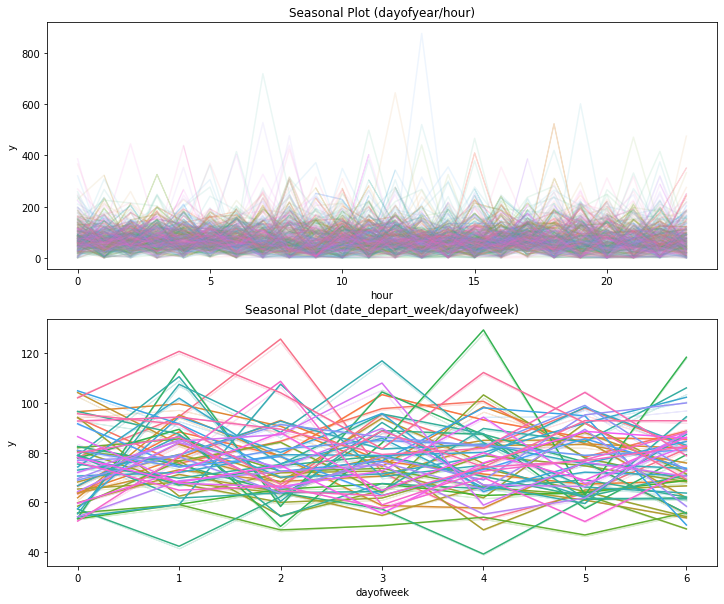

In [43]:
fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(12, 10))
seasonal_plot(data_route, y='y', period='dayofyear', freq='hour', ax=ax0, alpha=0.1)

df = data_route.resample('1D').median()
df['dayofweek'] = df.index.dayofweek
df["week"] = df.index.isocalendar().week.astype(int)
seasonal_plot(data_route, y='y', period='date_depart_week', freq='dayofweek', ax=ax1);

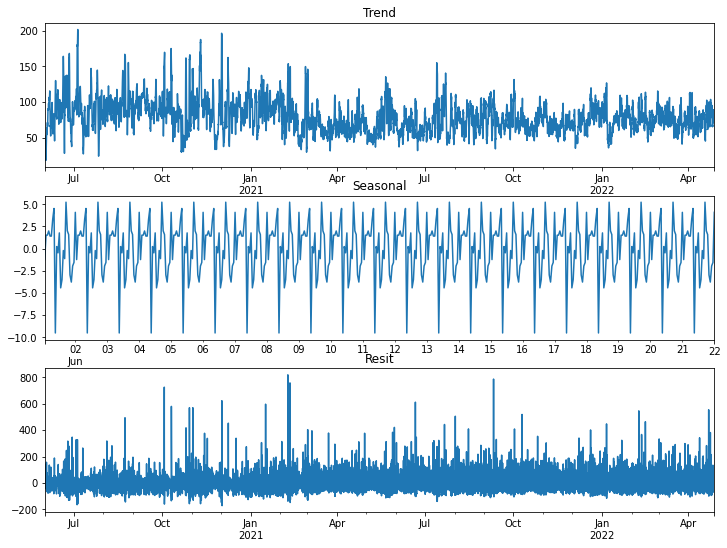

In [44]:
decomposed = seasonal_decompose(data_route['y'])
fig, (ax0, ax1, ax2) = plt.subplots(3, 1, figsize=(12, 9))
decomposed.trend.plot(title='Trend', xlabel='', ax=ax0);
decomposed.seasonal.head(24*21).plot(title='Seasonal', xlabel='', ax=ax1);
decomposed.resid.plot(title='Resit', xlabel='', ax=ax2);

## Выводы EDA
- удаляем выбросы по времни больше 1000ч (1,5 месяц)
- удаляю дату до 2019.12.01 - но это не точно
- дубликатов нет
- сделаны новый признаки даты, маршрута, категория маршрута для непопулярных, день недели, день года
- частот не видно, хотя суточная сезоннось выявилась
- тренд не просматривается

In [45]:
data = data[(data['datetime']>'2020-01-01')]
data = data[(data['y'] < 500)] 
#data = data[(data['distance'] < 7500)] 

In [46]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4162749 entries, 0 to 4219369
Data columns (total 31 columns):
 #   Column             Dtype         
---  ------             -----         
 0   st_code_snd        object        
 1   st_code_rsv        object        
 2   date_depart_year   int64         
 3   date_depart_month  int64         
 4   date_depart_week   int64         
 5   date_depart_day    int64         
 6   date_depart_hour   int64         
 7   fr_id              float64       
 8   route_type         float64       
 9   is_load            int64         
 10  rod                int64         
 11  common_ch          float64       
 12  vidsobst           float64       
 13  distance           float64       
 14  snd_org_id         int64         
 15  rsv_org_id         int64         
 16  snd_roadid         int32         
 17  rsv_roadid         int32         
 18  snd_dp_id          int64         
 19  rsv_dp_id          int64         
 20  y                  float

## Наборы признаков

In [47]:
#features = ['route_category', 'fr_id', 'route_type', 'is_load', 'rod', 'common_ch', 'vidsobst', 'distance', 'date_depart_hour']

In [48]:
features = ['route_category', 'date_depart_week', 'date_depart_month',
            'route_type', 'is_load', 'rod', 'common_ch', 'vidsobst', 'distance', 'date_depart_hour',
           'dayofweek', 'snd_org_id', 'rsv_org_id', 'snd_roadid', 
            #'rsv_roadid',  # ну можно и не убирать
            'snd_dp_id', 'rsv_dp_id']

In [49]:
features2 = [x for x in features if x not in ['fr_id', 'rod', 'common_ch', 'vidsobst', 'st_code_snd', 'st_code_rsv']]
features2

['route_category',
 'date_depart_week',
 'date_depart_month',
 'route_type',
 'is_load',
 'distance',
 'date_depart_hour',
 'dayofweek',
 'snd_org_id',
 'rsv_org_id',
 'snd_roadid',
 'snd_dp_id',
 'rsv_dp_id']

In [50]:
numeric_features = ['distance']
categorical_features = [x for x in features if x not in numeric_features]
categorical_features

['route_category',
 'date_depart_week',
 'date_depart_month',
 'route_type',
 'is_load',
 'rod',
 'common_ch',
 'vidsobst',
 'date_depart_hour',
 'dayofweek',
 'snd_org_id',
 'rsv_org_id',
 'snd_roadid',
 'snd_dp_id',
 'rsv_dp_id']

# Разделение выборки

In [51]:
df_f = data[features]
df_t = data['y']

train_f, test_f = train_test_split(df_f, shuffle=False, test_size=0.2)
train_t, test_t = train_test_split(df_t, shuffle=False, test_size=0.2)

print(train_f.shape)
print(train_t.shape)
print(test_f.shape)
print(test_t.shape)

(3330199, 16)
(3330199,)
(832550, 16)
(832550,)


# Моделирование
- Заполнение пропусков в пайплайне
- Пробовались разные алгоритмы. LR, LR на ограниченных признаках, LGBM без Grid, LBBM Grid
- CV на всей выборке долго работает и не позволяет использовать для валидации конец выборки по аналогии с тестом
- Переобучить на всей выборке 

In [52]:
stat = {}

In [53]:
def model(reg, isWood, \
          df_tv_f, df_tv_t, \
          categorical_features, numeric_features,\
          param_grid, cv = None, grid=True, test_f=None, test_t=None
         ):   

    if (isWood):
        categorical_transformer = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
        numeric_transformer = Pipeline(
            steps=[('imputer', SimpleImputer(strategy='most_frequent')),
                   ('scaler', StandardScaler())]
        )
    else:
        categorical_transformer = OneHotEncoder(drop='first', handle_unknown='ignore')
        numeric_transformer = Pipeline(
            steps=[
                    ('imputer', SimpleImputer(strategy='median')),
                    ('scaler', StandardScaler()), 
                    ('power', PowerTransformer())]
        )
    
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features),
        ]
    )

    pipe = Pipeline([
        ("preprocessor", preprocessor),
        ('reg', reg)
        #('reg', TransformedTargetRegressor(regressor=reg, transformer=QuantileTransformer(output_distribution='normal')))
        
    ])

    if grid:
        grid = GridSearchCV(pipe, param_grid, n_jobs=8, verbose=1, cv=cv, scoring='neg_root_mean_squared_error')
        grid.fit(df_tv_f, df_tv_t)
        print(grid.best_estimator_)        
        print('Best score:', grid.best_score_)
        return (grid.best_estimator_, grid.best_score_)    
    
    else:
        model = pipe.fit(df_tv_f, df_tv_t)
        score = mean_squared_error(test_t, model.predict(test_f)) ** 0.5
        print(model)
        print('Score:', score)
        return (model, score)    


## Baseline (LR2)

In [54]:
# base LR (features2)
%time stat["LR2"] = model( \
      LinearRegression(n_jobs=8), False, \
      train_f.head(100000), train_t.head(100000), \
      param_grid = {}, \
      categorical_features=[x for x in features2 if x in categorical_features], \
      numeric_features=[x for x in features2 if x in numeric_features], \
      grid=False, test_f=test_f, test_t=test_t);

/Users/dima/opt/anaconda3/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:188: UserWarning: Found unknown categories in columns [0, 7, 8, 9, 10, 11] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler()),
                                                                  ('power',
                                                                   PowerTransformer())]),
                                                  ['distance']),
                                                 ('cat',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'),
                                                  ['route_category',
                                          

## LGBM0

In [55]:
#temp_train, temp_test = train_test_split(data, shuffle=False, test_size=0.2)

#temp_train = temp_train[temp_train['y'] < 1000]

#temp_train_f = temp_train[features]
#temp_train_t = temp_train['y']
#temp_test_f = temp_test[features]
#temp_test_t = temp_test['y']

#print(temp_train_f.shape)
#print(temp_train_t.shape)
#print(temp_test_f.shape)
#print(temp_test_t.shape)

In [56]:
%time stat["LGBM0e"] = model( \
      lgb.LGBMRegressor(learning_rate=0.6, max_depth=15, n_estimators=2000, random_state=RANDOM_STATE), True, \
      train_f, train_t, \
      param_grid = { }, \
      categorical_features=categorical_features, \
      numeric_features=numeric_features, \
      grid=False, test_f=test_f, test_t=test_t);

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['distance']),
                                                 ('cat',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  ['route_category',
                                                   'date_depart_week',
                                                   'date_depart_month',
                                       

## Обучение лучшей модели на полной выборке

In [57]:
%time stat["LGBM0-Retrain"] = model( \
      lgb.LGBMRegressor(learning_rate=0.2, max_depth=15, n_estimators=12000, random_state=RANDOM_STATE), True, \
      df_f, df_t, \
      param_grid = { }, \
      categorical_features=categorical_features, \
      numeric_features=numeric_features, \
      grid=False, test_f=test_f, test_t=test_t);

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['distance']),
                                                 ('cat',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  ['route_category',
                                                   'date_depart_week',
                                                   'date_depart_month',
                                       

## Сохранение моделей

In [58]:
with open('model.pickle', 'wb') as f:
    pickle.dump(stat["LGBM0-Retrain"][0], f)

In [59]:
with open('rc.pickle', 'wb') as f:
    pickle.dump(rc, f)

## Генерация предсказания на тесте

In [60]:
public_test_df = pd.read_parquet('datasets/df_test.parquet')

In [61]:
# это набор для теста REST API и Web UI
public_test_df.head(1).transpose()

,0
st_code_snd,happy:)pgkwagon:):)
st_code_rsv,pgk2022newyear:)pgk
date_depart_year,2022
date_depart_month,9
date_depart_week,35
date_depart_day,1
date_depart_hour,9
fr_id,2261.0
route_type,3.0
is_load,0


In [62]:
def row_process(route_category):
    if route_category not in rc.keys():
        return route_category
    
    if rc[route_category] > 3:  #10
        return route_category
    
    return 'other'

def preprocess(df_p):
    df_p['route'] = df_p['st_code_snd'] + df_p['st_code_rsv']
    df_p['route_category'] = df_p['route'].apply(row_process)

In [63]:
preprocess(public_test_df)

In [64]:
public_test_df['year'] = public_test_df['date_depart_year']
public_test_df['month'] = public_test_df['date_depart_month']
public_test_df['day'] = public_test_df['date_depart_day']
public_test_df['hour'] = public_test_df['date_depart_hour']
public_test_df['minute'] = 0
public_test_df['second'] = 0

public_test_df['datetime'] = pd.to_datetime(public_test_df[['year', 'month', 'day', 'hour', 'minute', 'second']])

public_test_df['dayofweek'] = public_test_df['datetime'].dt.dayofweek

In [65]:
predict = stat["LGBM0-Retrain"][0].predict(public_test_df[features])
predict

array([216.82558328, 147.51613521, 196.60631558, ...,   5.37728757,
       105.5367842 , 103.40837757])

In [66]:
res = pd.DataFrame({'time': predict})

In [67]:
res.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1182903 entries, 0 to 1182902
Data columns (total 1 columns):
 #   Column  Non-Null Count    Dtype  
---  ------  --------------    -----  
 0   time    1182903 non-null  float64
dtypes: float64(1)
memory usage: 9.0 MB


In [68]:
res.to_csv('result.csv',index=False)

## Возможные улучшения на будущее
- отдельная модель заполнения пропусков в дистанции (сейчас замена на медианное значение)